In [20]:
import pandas as pd
from pathlib import Path

# ---------------------------------------------------------------------
# ZENTRALE BASISPFADE
# ---------------------------------------------------------------------
BASE_DIR = Path("/Users/felixipfling/Documents/GitHub/codex_start/data")
PROCESSED_DIR = BASE_DIR / "processed"

# ---------------------------------------------------------------------
# DATEI-DEFINITIONEN (einheitlich, erweiterbar)
# ---------------------------------------------------------------------
DATASETS = {
    "bev_kohorten_2024": {
        "path": PROCESSED_DIR / "raw_bev_kohorten_2024.csv",
        "read_kwargs": {}
    },
    "vgr": {
        "path": BASE_DIR / "rawDEmNums_df.csv",
        "read_kwargs": {"sep": ";", "dtype": str}
    },
    "bev_total": {
        "path": PROCESSED_DIR / "raw_bev_total_long.csv",
        "read_kwargs": {"dtype": str}
    },
    "pkw": {
        "path": PROCESSED_DIR / "Pkw.csv",
        "read_kwargs": {"dtype": str}
    }
}

# ---------------------------------------------------------------------
# LADEN DER DATAFRAMES
# ---------------------------------------------------------------------
dfs = {}
metadata = {}

for name, cfg in DATASETS.items():
    df = pd.read_csv(cfg["path"], **cfg["read_kwargs"])
    dfs[name] = df
    
    metadata[name] = {
        "path": str(cfg["path"]),
        "columns": list(df.columns)
    }

# ---------------------------------------------------------------------
# AUSGABE: ÜBERSICHT
# ---------------------------------------------------------------------
print("GELADENE DATASETS UND SPALTEN")
print("=" * 80)

for name, meta in metadata.items():
    print(f"\nDataset: {name}")
    print(f"Pfad: {meta['path']}")
    print("Spalten:")
    for col in meta["columns"]:
        print(f"  - {col}")

# ---------------------------------------------------------------------
# BEISPIEL-ZUGRIFFE (für späteren Code)
# ---------------------------------------------------------------------
# DataFrame:
# dfs["bev_total"]

# Spaltenliste:
# metadata["bev_total"]["columns"]

# Pfad:
# metadata["bev_total"]["path"]


GELADENE DATASETS UND SPALTEN

Dataset: bev_kohorten_2024
Pfad: /Users/felixipfling/Documents/GitHub/codex_start/data/processed/raw_bev_kohorten_2024.csv
Spalten:
  - kreis_id
  - kreis_name
  - bev_total_2024
  - m_u18
  - w_u18
  - m_18_34
  - w_18_34
  - m_35_59
  - w_35_59
  - m_60_74
  - w_60_74
  - m_75plus
  - w_75plus
  - bev_18_35
  - bev_65_plus

Dataset: vgr
Pfad: /Users/felixipfling/Documents/GitHub/codex_start/data/rawDEmNums_df.csv
Spalten:
  - kreis_id
  - jahr
  - Arbeitnehmerentgelt_insgesamt_Anteil_am_Land_in
  - Arbeitnehmerentgelt_Land_und_Forstwirtschaft_Fischerei_in_Mio_EUR
  - Arbeitnehmerentgelt_Produzierendes_Gewerbe_in_Mio_EUR
  - Arbeitnehmerentgelt_Produzierendes_Gewerbe_ohne_Baugewerbe_in_Mio_EUR
  - Arbeitnehmerentgelt_Verarbeitendes_Gewerbe_in_Mio_EUR
  - Arbeitnehmerentgelt_Baugewerbe_in_Mio_EUR
  - Arbeitnehmerentgelt_Dienstleistungsbereiche_in_Mio_EUR
  - Arbeitnehmerentgelt_Handel_Verkehr_und_Lagerei_Gastgewerbe_Information_und_Kommunikation_in_Mio_EU

In [72]:
import pandas as pd
from IPython.display import display

def diagnose_dataframe(df, name, key_cols=None):
    """
    Prüft einen DataFrame auf:
    - fehlende Werte (NaN)
    - vollständig verfügbare Spalten
    - optional: Schlüsselspalten, die ignoriert werden dürfen
    """
    if key_cols is None:
        key_cols = []

    n_rows = df.shape[0]

    summary = []
    for c in df.columns:
        n_missing = df[c].isna().sum()
        summary.append({
            "variable": c,
            "missing": n_missing,
            "missing_pct": n_missing / n_rows * 100,
            "vollstaendig": n_missing == 0
        })

    summary_df = (
        pd.DataFrame(summary)
        .sort_values("missing_pct", ascending=False)
        .reset_index(drop=True)
    )

    complete_vars = summary_df.loc[
        (summary_df["vollstaendig"]) & (~summary_df["variable"].isin(key_cols)),
        "variable"
    ].tolist()

    print(f"\nDEBUG: {name}")
    print("=" * 70)
    print(f"Beobachtungen (Zeilen): {n_rows}")
    print(f"Variablen gesamt: {df.shape[1]}")
    print(f"Vollständige Variablen (ohne Schlüssel): {len(complete_vars)}")

    print("\nVOLLSTÄNDIGE VARIABLEN:")
    for v in complete_vars:
        print(f"  - {v}")

    print("\nDETAILÜBERSICHT (Missing):")
    display(summary_df)

    return complete_vars, summary_df


In [73]:
vgr_complete_vars, vgr_missing_summary = diagnose_dataframe(
    vgr_num,
    name="VGR (nach Typisierung)",
    key_cols=["kreis_id", "jahr"]
)



DEBUG: VGR (nach Typisierung)
Beobachtungen (Zeilen): 1592
Variablen gesamt: 66
Vollständige Variablen (ohne Schlüssel): 30

VOLLSTÄNDIGE VARIABLEN:
  - anteil_dl_besch
  - lohn_pro_stunde
  - entgelt_pro_stunde
  - anteil_pg_besch
  - anteil_vg_besch
  - Bruttoloehne_und_gehaelter_je_Arbeitsstunde_der_Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_EUR
  - Arbeitnehmerentgelt_je_Arbeitsstunde_der_Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_EUR
  - Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbeitnehmer_Baugewerbe_in_Mio_Arbeitsstunden
  - arbeitsstunden_pro_arb
  - Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbeitnehmer_Oeffentliche_und_sonstige_Dienstleistungen_Erziehung_und_Gesundheit_in_Mio_Arbeitsstunden
  - Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbeitnehmer_6_4_2_Finanz_Versicherungs_und_Unternehmensdienstleister_Grundstuecks_u_Wohnungswesen_in_Mio_Arbeitsstunden
  - Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbeitnehmer_Handel_Verkehr_und_Lagerei_Gastgewerbe_Information_und_K

,variable,missing,missing_pct,vollstaendig
0,Arbeitnehmerentgelt_Finanz_Versicherungsdienst...,1592,100.0,False
1,entgelt_pro_arb,1592,100.0,False
2,Arbeitnehmerentgelt_Unternehmensdienstleistung...,1592,100.0,False
3,Arbeitnehmerentgelt_Grundstuecks_und_Wohnungsw...,1592,100.0,False
4,Arbeitnehmerentgelt_Information_und_Kommunikat...,1592,100.0,False
...,...,...,...,...
61,Arbeitnehmerinnen_und_Arbeitnehmer_Oeffentlich...,0,0.0,True
62,Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbei...,0,0.0,True
63,Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbei...,0,0.0,True
64,Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbei...,0,0.0,True


## Datenkonzeption und Variablenbildung

Die Analyse basiert auf einer panelstrukturierten Datengrundlage auf Kreisebene, bei der jede Beobachtung einen Landkreis in einem bestimmten Jahr beschreibt. Ziel ist die Untersuchung von Zusammenhängen zwischen der regionalen Durchdringung von Elektromobilität und sozioökonomischen sowie demografischen Strukturmerkmalen.

### Zielvariable

Als abhängige Variable wird die E-Auto-Quote definiert, gemessen als Anteil elektrisch betriebener Pkw am gesamten Pkw-Bestand eines Kreises in einem Jahr. Diese Operationalisierung erlaubt einen vergleichbaren Maßstab zwischen unterschiedlich großen Regionen und bildet die Marktdurchdringung von Elektromobilität ab.

### Ökonomische Leistungsfähigkeit

Die ökonomische Leistungsfähigkeit eines Kreises wird über durchschnittliche Einkommens- und Entgeltkennzahlen operationalisiert. Verwendet werden ausschließlich Pro-Kopf- bzw. Pro-Beschäftigten-Größen, um Verzerrungen durch die Kreisgröße zu vermeiden.

### Wirtschafts- und Arbeitsmarktstruktur

Zur Abbildung struktureller Unterschiede zwischen Regionen werden sektorale Beschäftigtenanteile verwendet. Diese beschreiben die relative Bedeutung zentraler Wirtschaftssektoren und dienen der Erfassung struktureller Rahmenbedingungen der regionalen Wirtschaft.

### Demografische Struktur

Demografische Merkmale werden über Altersanteile operationalisiert. Da Altersstrukturdaten nur für das Jahr 2024 vorliegen, werden diese als zeitlich stabile Strukturmerkmale interpretiert und für den gesamten Analysezeitraum verwendet.

### Mobilitätskontext

Zur Kontrolle unterschiedlicher Mobilitätsniveaus wird die Pkw-Dichte pro 1.000 Einwohner in die Analyse aufgenommen.

### Vergleichbarkeitsregeln

Alle Variablen werden als relative Größen (Quoten, Anteile oder Pro-Kopf-Werte) verwendet. Absolute Größen werden nicht direkt in die Analyse aufgenommen, um systematische Verzerrungen zwischen unterschiedlich großen Kreisen zu vermeiden.


## Master-Panel (Mehrjahresdaten)

In [74]:
import pandas as pd

# ==================================================
# 0) DataFrames aus der Registry holen
# ==================================================
vgr_df = dfs["vgr"].copy()
bev_total_df = dfs["bev_total"].copy()
pkw_df = dfs["pkw"].copy()
bev_kohorten_df = dfs["bev_kohorten_2024"].copy()

# ==================================================
# 1) Einheitliche Typisierung der Schlüssel
# ==================================================
vgr_df["jahr"] = pd.to_numeric(vgr_df["jahr"], errors="coerce").astype("Int64")
bev_total_df["jahr"] = pd.to_numeric(bev_total_df["jahr"], errors="coerce").astype("Int64")

# ==================================================
# 2) VGR: numerische Typisierung
# ==================================================
vgr_num = vgr_df.copy()

for c in vgr_num.columns:
    if c not in ["kreis_id", "jahr"]:
        vgr_num[c] = pd.to_numeric(vgr_num[c], errors="coerce")

# Schutz vor Division durch 0
vgr_num.loc[
    vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"] == 0,
    "Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"
] = pd.NA

# ==================================================
# 3) Latente Dimension A: Einkommensniveau (KORRIGIERT)
# ==================================================
# → Rekonstruktion aus vollständigen Aggregaten

# Gesamtentgelt (Hauptsektoren)
vgr_num["entgelt_gesamt_mio"] = (
    vgr_num["Arbeitnehmerentgelt_Land_und_Forstwirtschaft_Fischerei_in_Mio_EUR"]
    + vgr_num["Arbeitnehmerentgelt_Produzierendes_Gewerbe_in_Mio_EUR"]
    + vgr_num["Arbeitnehmerentgelt_Dienstleistungsbereiche_in_Mio_EUR"]
)

# Gesamtlohn (Hauptsektoren)
vgr_num["lohn_gesamt_mio"] = (
    vgr_num["Bruttoloehne_und_gehaelter_Land_und_Forstwirtschaft_Fischerei_in_Mio_EUR"]
    + vgr_num["Bruttoloehne_und_gehaelter_Produzierendes_Gewerbe_in_Mio_EUR"]
    + vgr_num["Bruttoloehne_und_gehaelter_Dienstleistungsbereiche_in_Mio_EUR"]
)

# Pro Arbeitnehmer (EUR)
vgr_num["entgelt_pro_arb"] = (
    vgr_num["entgelt_gesamt_mio"]
    / vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"]
    * 1000
)

vgr_num["lohn_pro_arb"] = (
    vgr_num["lohn_gesamt_mio"]
    / vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"]
    * 1000
)

# Pro Arbeitsstunde (direkt vorhanden, vollständig)
vgr_num["entgelt_pro_stunde"] = (
    vgr_num["Arbeitnehmerentgelt_je_Arbeitsstunde_der_Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_EUR"]
)

vgr_num["lohn_pro_stunde"] = (
    vgr_num["Bruttoloehne_und_gehaelter_je_Arbeitsstunde_der_Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_EUR"]
)

# ==================================================
# 4) Latente Dimension B: Beschäftigungsstruktur
# ==================================================
vgr_num["anteil_dl_besch"] = (
    vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_Dienstleistungsbereiche_in_1000_Personen"]
    / vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"]
)

vgr_num["anteil_pg_besch"] = (
    vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_Produzierendes_Gewerbe_in_1000_Personen"]
    / vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"]
)

vgr_num["anteil_vg_besch"] = (
    vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_Verarbeitendes_Gewerbe_in_1000_Personen"]
    / vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"]
)

# ==================================================
# 5) Latente Dimension D: Arbeitsintensität
# ==================================================
vgr_num["arbeitsstunden_pro_arb"] = (
    vgr_num["Arbeitsvolumen_der_Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_Mio_Arbeitsstunden"]
    / vgr_num["Arbeitnehmerinnen_und_Arbeitnehmer_insgesamt_in_1000_Personen"]
)

# ==================================================
# 6) Latente Dimension E: Dynamik
# ==================================================
vgr_num["lohn_wachstum"] = (
    vgr_num["Bruttoloehne_und_gehaelter_insgesamt_Veraenderung_gegenueber_dem_Vorjahr_in"]
)

# ==================================================
# 7) PKW-Daten
# ==================================================
for c in [
    "pkw_benzin", "pkw_diesel", "pkw_gas", "pkw_elektrisch",
    "pkw_hybrid", "pkw_plugin", "pkw_sonstige", "pkw_gesamt"
]:
    pkw_df[c] = pd.to_numeric(pkw_df[c], errors="coerce")

pkw_df["jahr"] = pd.to_datetime(
    pkw_df["stichtag"], errors="coerce"
).dt.year.astype("Int64")

pkw_df["e_auto_quote"] = pkw_df["pkw_elektrisch"] / pkw_df["pkw_gesamt"]

# ==================================================
# 8) Bevölkerungsdaten
# ==================================================
bev_total_df["bev_total"] = pd.to_numeric(
    bev_total_df["bev_total"], errors="coerce"
)

# ==================================================
# 9) Panel-Merge
# ==================================================
panel = (
    pkw_df
    .merge(bev_total_df, on=["kreis_id", "jahr"], how="left")
    .merge(vgr_num, on=["kreis_id", "jahr"], how="left")
)

# ==================================================
# 10) Mobilitätskontrolle
# ==================================================
panel["pkw_pro_1000"] = panel["pkw_gesamt"] / panel["bev_total"] * 1000

# ==================================================
# 11) Demografie (zeitinvariant)
# ==================================================
bev_kohorten_df["anteil_18_35"] = (
    bev_kohorten_df["bev_18_35"] / bev_kohorten_df["bev_total_2024"]
)

bev_kohorten_df["anteil_65_plus"] = (
    bev_kohorten_df["bev_65_plus"] / bev_kohorten_df["bev_total_2024"]
)

panel = panel.merge(
    bev_kohorten_df[["kreis_id", "anteil_18_35", "anteil_65_plus"]],
    on="kreis_id",
    how="left"
)

# ==================================================
# 12) Analysezeitraum
# ==================================================
panel = panel.loc[panel["jahr"].between(2020, 2023)]

# ==================================================
# 13) Defragmentieren
# ==================================================
panel = panel.copy()


In [86]:
VARIABLE_GROUPS = {
    "zielvariable": [
        "e_auto_quote"
    ],

    "mobilitaetsniveau": [
        "pkw_pro_1000"
    ],

    "einkommensniveau": [
        "lohn_pro_stunde",
        "entgelt_pro_stunde",

    ],

    "wirtschaftsstruktur_beschaeftigung": [
        "anteil_dl_besch",
        "anteil_pg_besch",
        "anteil_vg_besch"
    ],

    "arbeitsintensitaet": [
        "arbeitsstunden_pro_arb"
    ],

    "dynamik": [
        "lohn_wachstum"
    ],

    "demografie": [
        "anteil_18_35",
        "anteil_65_plus"
    ]
}


In [87]:
import geopandas as gpd

GEO_PATH = "/Users/felixipfling/Documents/GitHub/codex_start/data/counties.json"

gdf = gpd.read_file(GEO_PATH).copy()
gdf["id"] = gdf["id"].astype(str).str.zfill(5)


## Datenaufbereitung und Konstruktion des Analysepanels

In diesem Abschnitt wird die vollständige Datenaufbereitung beschrieben, die zur Konstruktion eines konsistenten Analysepanels auf Kreisebene notwendig ist. Ziel dieses Schrittes ist es, alle verfügbaren Datensätze in eine gemeinsame, vergleichbare Struktur zu überführen, die anschließend für explorative Korrelationsanalysen genutzt werden kann.

### Grundidee der Panelkonstruktion

Die Analyse basiert auf einer Panelstruktur, bei der jede Beobachtung einen Landkreis in einem bestimmten Jahr beschreibt. Alle Datensätze werden daher über die gemeinsamen Schlüssel `kreis_id` und `jahr` zusammengeführt. Dies stellt sicher, dass alle betrachteten Variablen zeitlich und räumlich eindeutig zugeordnet sind.

### Einheitliche Typisierung und Schlüsselharmonisierung

Ein zentraler Vorbereitungsschritt besteht in der Vereinheitlichung der Datentypen. Insbesondere die Jahresvariable `jahr` liegt in den verschiedenen Datensätzen teilweise als Zeichenkette, teilweise als numerischer Wert vor. Vor dem Zusammenführen der Daten wird `jahr` daher in allen Datensätzen explizit als numerischer Wert interpretiert. Dies ist notwendig, da Pandas Zusammenführungen nur bei identischen Datentypen zulässt.

Zusätzlich werden alle potenziell numerischen Variablen explizit in numerische Datentypen umgewandelt. Nicht interpretierbare Werte werden dabei als fehlend markiert, um stille Rechenfehler zu vermeiden.

### Operationalisierung ökonomischer Dimensionen (VGR-Daten)

Die Variablen der volkswirtschaftlichen Gesamtrechnungen werden nicht direkt in ihrer Rohform verwendet, sondern entlang theoretisch definierter latenter Dimensionen aufbereitet.

#### Einkommensniveau

Das regionale Einkommensniveau wird über Entgelt- und Lohnkennzahlen pro Arbeitnehmer sowie pro Arbeitsstunde operationalisiert. Diese Größen erfassen die finanzielle Leistungsfähigkeit der Erwerbstätigen und dienen als Indikatoren für die Fähigkeit zur Adoption neuer, kostenintensiver Technologien.

#### Wirtschaftsstruktur (Beschäftigung)

Die sektorale Wirtschaftsstruktur eines Kreises wird über Beschäftigtenanteile abgebildet. Hierzu werden die Beschäftigtenzahlen einzelner Wirtschaftsbereiche ins Verhältnis zur Gesamtbeschäftigung gesetzt. Diese Anteile erfassen strukturelle Unterschiede zwischen Regionen und sind weniger volatil als monetäre Größen.

#### Wertschöpfungs- und Entgeltstruktur

Ergänzend zur Beschäftigungsstruktur wird die Entgeltstruktur betrachtet. Hierbei werden sektorale Anteile am gesamten Arbeitnehmerentgelt berechnet. Während Beschäftigtenanteile abbilden, wo Menschen arbeiten, geben Entgeltanteile Auskunft darüber, in welchen Wirtschaftsbereichen Einkommen generiert wird.

#### Arbeitsintensität und Arbeitsorganisation

Die Arbeitsintensität wird über Arbeitsstunden pro Beschäftigten operationalisiert. Diese Kennzahl liefert Hinweise auf regionale Unterschiede in Arbeitszeitmodellen, Produktivität und strukturellen Arbeitsbedingungen.

#### Dynamik und Wachstumsindikatoren

Zur Erfassung zeitlicher Dynamiken werden Veränderungsraten der Bruttolöhne gegenüber dem Vorjahr berücksichtigt. Diese Variablen werden ausschließlich explorativ interpretiert und dienen der Kontextualisierung zeitlicher Entwicklungen.

### Aufbereitung der Mobilitätsdaten

Die Pkw-Daten werden auf Jahresniveau harmonisiert, indem aus dem Stichtagsdatum das jeweilige Jahr extrahiert wird. Die zentrale Zielvariable der Analyse, die E-Auto-Quote, wird als Anteil elektrisch betriebener Pkw am gesamten Pkw-Bestand eines Kreises berechnet. Diese Operationalisierung erlaubt einen vergleichbaren Maßstab zwischen unterschiedlich großen Regionen.

Zusätzlich wird die Pkw-Dichte pro 1.000 Einwohner berechnet, um Unterschiede im allgemeinen Mobilitätsniveau zwischen Kreisen zu kontrollieren.

### Integration der Bevölkerungsdaten

Die jährlichen Bevölkerungsdaten werden zur Normierung mobilitätsbezogener Größen genutzt. Darüber hinaus werden Altersstrukturdaten in das Panel integriert. Da diese nur für einen einzelnen Stichtag vorliegen, werden sie als zeitlich stabile Strukturmerkmale interpretiert und für den gesamten Analysezeitraum verwendet.

### Umgang mit fehlenden Werten und Robustheit

Divisionen durch Nullwerte werden explizit ausgeschlossen, indem entsprechende Beobachtungen als fehlend markiert werden. Dadurch wird sichergestellt, dass keine verzerrten oder künstlichen Werte in das Analysepanel eingehen.

### Festlegung des Analysezeitraums

Der Analysezeitraum wird explizit auf die Jahre 2020 bis 2023 begrenzt. Diese Einschränkung stellt sicher, dass für alle verwendeten Variablen eine konsistente Datenverfügbarkeit gegeben ist und vermeidet implizite Annahmen über nicht beobachtete Zeiträume.

### Ergebnis dieses Schrittes

Das Ergebnis der beschriebenen Datenaufbereitung ist ein konsistentes, panelstrukturiertes Datenset auf Kreisebene. Alle enthaltenen Variablen sind normiert, vergleichbar und theoretisch begründet. Dieses Panel bildet die Grundlage für die anschließenden explorativen Korrelationsanalysen, bei denen Zusammenhänge zwischen der regionalen Verbreitung von Elektromobilität und sozioökonomischen sowie demografischen Strukturen untersucht werden.


In [88]:
import numpy as np
import folium

def plot_panel_map(
    panel_df,
    value_col,
    year,
    kreis_col="kreis_id"
):
    df = panel_df.copy()

    df[kreis_col] = df[kreis_col].astype(str).str.zfill(5)
    df[value_col] = pd.to_numeric(df[value_col], errors="coerce")

    df = df.loc[df["jahr"] == year]
    df = df.dropna(subset=[value_col])

    mean_val = df[value_col].mean()
    df["diff"] = df[value_col] - mean_val
    df["diff_abs"] = df["diff"].abs()

    gdfm = gdf.merge(
        df[[kreis_col, value_col, "diff", "diff_abs"]],
        left_on="id",
        right_on=kreis_col,
        how="left"
    )

    max_abs = np.nanquantile(gdfm["diff_abs"], 0.98)
    if not np.isfinite(max_abs) or max_abs == 0:
        max_abs = 1e-9

    def clamp01(x):
        return max(0.0, min(1.0, x))

    def color_from_diff(d):
        if d is None or (isinstance(d, float) and np.isnan(d)):
            return "#d9d9d9"
        t = clamp01(abs(d) / max_abs)
        if d >= 0:
            r, g, b = int(230*(1-t)), 255, int(230*(1-t))
        else:
            r, g, b = 255, int(230*(1-t)), int(230*(1-t))
        return f"#{r:02x}{g:02x}{b:02x}"

    m = folium.Map(location=[51, 10], zoom_start=6, tiles="CartoDB positron")

    folium.GeoJson(
        gdfm.__geo_interface__,
        style_function=lambda f: {
            "fillColor": color_from_diff(f["properties"].get("diff")),
            "color": "#666666",
            "weight": 0.4,
            "fillOpacity": 0.8,
        },
        tooltip=folium.GeoJsonTooltip(
            fields=["name", value_col, "diff"],
            aliases=["Kreis", value_col, "Abweichung vom Mittel"],
            localize=True
        )
    ).add_to(m)

    display(m)


## Methodisches Vorgehen

### Untersuchungsdesign und Analyseeinheit

Die vorliegende Untersuchung folgt einem quantitativen, explorativen Forschungsdesign. Ziel ist die Analyse bivariater Zusammenhänge zwischen der regionalen Verbreitung von Elektromobilität und sozioökonomischen sowie demografischen Strukturmerkmalen. Die Analyseeinheit ist der Landkreis in einem bestimmten Jahr. Entsprechend basiert die Untersuchung auf einer Panelstruktur, bei der jede Beobachtung einen Landkreis (`kreis_id`) in einem Kalenderjahr (`jahr`) repräsentiert.

Die Wahl der Kreisebene ermöglicht einen systematischen Vergleich regionaler Unterschiede, während die Berücksichtigung der Zeitdimension erlaubt, strukturelle Veränderungen und zeitliche Stabilitäten explizit zu berücksichtigen.

### Datenbasis und Zusammenführung

Die Analyse stützt sich auf mehrere amtliche Datensätze, darunter Pkw-Bestandsdaten, Bevölkerungsstatistiken sowie volkswirtschaftliche Gesamtrechnungen auf regionaler Ebene. Alle Datensätze werden über die gemeinsamen Schlüssel `kreis_id` und `jahr` zusammengeführt. Voraussetzung für diese Zusammenführung ist eine explizite Harmonisierung der Datentypen, insbesondere der Jahresvariable, um eine konsistente zeitliche Zuordnung sicherzustellen.

Die resultierende Datenstruktur bildet ein unbalanciertes Panel, dessen zeitliche Abdeckung durch die jeweilige Datenverfügbarkeit bestimmt ist.

### Operationalisierung der Zielvariable

Als zentrale abhängige Variable wird die E-Auto-Quote verwendet. Diese wird definiert als der Anteil elektrisch betriebener Pkw am gesamten Pkw-Bestand eines Landkreises in einem Jahr. Diese Operationalisierung misst die relative Marktdurchdringung von Elektromobilität und ist unabhängig von der absoluten Größe des Fahrzeugbestands oder der Bevölkerung eines Kreises.

Die Verwendung einer relativen Kennzahl stellt sicher, dass Stadt- und Landkreise vergleichbar sind und vermeidet Verzerrungen durch unterschiedliche Größenordnungen.

### Operationalisierung erklärender Variablen

Die erklärenden Variablen werden entlang theoretisch definierter latenter Dimensionen gebildet. Die Variablen der volkswirtschaftlichen Gesamtrechnungen werden dabei nicht in ihrer Rohform verwendet, sondern durch geeignete Normierungen und Anteilsbildungen vergleichbar gemacht.

#### Einkommensniveau

Das regionale Einkommensniveau wird über durchschnittliche Entgelt- und Lohnkennzahlen pro Arbeitnehmer sowie pro Arbeitsstunde operationalisiert. Diese Größen erfassen die finanzielle Leistungsfähigkeit der Erwerbstätigen und dienen als Indikatoren für die Fähigkeit zur Adoption kostenintensiver neuer Technologien.

#### Wirtschaftsstruktur

Die sektorale Wirtschaftsstruktur eines Kreises wird über Beschäftigtenanteile in zentralen Wirtschaftsbereichen abgebildet. Hierzu werden die Beschäftigtenzahlen einzelner Sektoren ins Verhältnis zur Gesamtbeschäftigung gesetzt. Diese Anteile erfassen strukturelle Unterschiede zwischen Regionen und sind weniger konjunkturabhängig als monetäre Größen.

#### Wertschöpfungs- und Entgeltstruktur

Ergänzend zur Beschäftigungsstruktur werden sektorale Anteile am gesamten Arbeitnehmerentgelt betrachtet. Während Beschäftigtenanteile abbilden, in welchen Bereichen Menschen arbeiten, geben Entgeltanteile Auskunft darüber, in welchen Wirtschaftsbereichen Einkommen generiert wird. Diese Differenzierung erlaubt eine feinere Charakterisierung der regionalen Wirtschaftsstruktur.

#### Arbeitsintensität

Zur Abbildung der Arbeitsorganisation werden Arbeitsstunden pro Beschäftigten berechnet. Diese Kennzahl dient der Kontextualisierung regionaler Unterschiede in Arbeitszeitmodellen, Produktivität und strukturellen Arbeitsbedingungen.

#### Demografische Struktur

Demografische Merkmale werden über Altersanteile operationalisiert. Da detaillierte Altersstrukturdaten nur für einen einzelnen Stichtag vorliegen, werden diese als zeitlich stabile Strukturmerkmale interpretiert und für den gesamten Analysezeitraum verwendet. Diese Annahme ist vor dem Hintergrund langsamer demografischer Veränderungen auf regionaler Ebene vertretbar.

### Vergleichbarkeits- und Transformationsregeln

Um Verzerrungen durch unterschiedlich große Landkreise zu vermeiden, werden ausschließlich relative Größen verwendet. Absolute monetäre oder mengenmäßige Werte gehen nicht direkt in die Analyse ein. Alle normierenden Größen (z. B. Bevölkerung, Beschäftigtenzahl) werden aus konsistenten Datenquellen entnommen.

Divisionen durch Nullwerte werden explizit ausgeschlossen, indem entsprechende Beobachtungen als fehlend behandelt werden. Dadurch wird sichergestellt, dass keine künstlichen oder verzerrten Werte in die Analyse eingehen.

### Analysezeitraum

Der Analysezeitraum wird auf die Jahre 2020 bis 2023 begrenzt. Diese Einschränkung stellt sicher, dass für alle verwendeten Variablen eine konsistente Datenverfügbarkeit gegeben ist und vermeidet implizite Annahmen über Zeiträume außerhalb der beobachteten Datenbasis.

### Analysestrategie

Die Untersuchung verfolgt einen zweistufigen Ansatz. In einem ersten Schritt werden explorativ bivariate Korrelationen zwischen der E-Auto-Quote und einer breiten Auswahl erklärender Variablen berechnet. In einem zweiten Schritt werden die Ergebnisse entlang der definierten latenten Dimensionen interpretiert, um zu vermeiden, dass mehrere hoch korrelierte Indikatoren desselben Konstrukts überinterpretiert werden.

Ziel der Analyse ist nicht die Identifikation kausaler Effekte, sondern die systematische Beschreibung von Zusammenhangsmustern, die Hinweise auf strukturelle Bedingungen der regionalen Verbreitung von Elektromobilität liefern.


In [85]:
year_sel = panel["jahr"].max()

plot_panel_map(
    panel,
    value_col="e_auto_quote",
    year=year_sel
)


In [89]:
for group, vars_ in VARIABLE_GROUPS.items():
    print("\n" + "="*80)
    print(f"LATENTE DIMENSION: {group.upper()}")
    print("="*80)

    for v in vars_:
        if v in panel.columns:
            print(f"\nVariable: {v}")
            plot_panel_map(
                panel,
                value_col=v,
                year=year_sel
            )



LATENTE DIMENSION: ZIELVARIABLE

Variable: e_auto_quote



LATENTE DIMENSION: MOBILITAETSNIVEAU

Variable: pkw_pro_1000



LATENTE DIMENSION: EINKOMMENSNIVEAU

Variable: lohn_pro_stunde



Variable: entgelt_pro_stunde



LATENTE DIMENSION: WIRTSCHAFTSSTRUKTUR_BESCHAEFTIGUNG

Variable: anteil_dl_besch



Variable: anteil_pg_besch



Variable: anteil_vg_besch



LATENTE DIMENSION: ARBEITSINTENSITAET

Variable: arbeitsstunden_pro_arb



LATENTE DIMENSION: DYNAMIK

Variable: lohn_wachstum



LATENTE DIMENSION: DEMOGRAFIE

Variable: anteil_18_35



Variable: anteil_65_plus


## Explorative Korrelationsanalyse

Aufbauend auf der deskriptiven und räumlichen Exploration wird im Folgenden eine systematische Korrelationsanalyse durchgeführt. Ziel dieses Schrittes ist es, bivariate Zusammenhänge zwischen der regionalen Verbreitung von Elektromobilität und einzelnen sozioökonomischen sowie demografischen Merkmalen zu identifizieren.

Die Analyse ist ausdrücklich explorativ angelegt. Es werden keine kausalen Effekte unterstellt, sondern lineare Zusammenhangsmuster beschrieben. Die Ergebnisse dienen der Einordnung, Gewichtung und späteren Reduktion erklärender Variablen.

### Analysestrategie

Die Korrelationsanalyse erfolgt in drei Grundprinzipien:

1. Jede erklärende Variable wird **einzeln** mit der E-Auto-Quote korreliert.
2. Die Analyse erfolgt **dimensionsweise**, entsprechend der zuvor definierten latenten Konstrukte.
3. Es werden ausschließlich Beobachtungen mit vollständigen Wertepaaren berücksichtigt (listwise deletion).

Als Korrelationsmaß wird der **Pearson-Korrelationskoeffizient** verwendet. Dieser misst die Stärke und Richtung linearer Zusammenhänge zwischen zwei metrischen Variablen. Ergänzend werden die jeweilige Stichprobengröße sowie das Signifikanzniveau ausgewiesen.

Die Ergebnisse werden zunächst tabellarisch dargestellt und anschließend entlang der theoretischen Dimensionen interpretiert.


In [41]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr


In [93]:
def corr_single(df, x, y):
    """
    Berechnet Pearson-Korrelation zwischen x und y
    mit listwise deletion.
    """
    tmp = df[[x, y]].dropna()
    n = len(tmp)

    if n < 10:
        return {
            "variable": x,
            "r": np.nan,
            "p": np.nan,
            "n": n
        }

    r, p = pearsonr(tmp[x], tmp[y])

    return {
        "variable": x,
        "r": r,
        "p": p,
        "n": n
    }


In [94]:
TARGET = "e_auto_quote"

corr_results = []

for group, vars_ in VARIABLE_GROUPS.items():
    if group == "zielvariable":
        continue

    for var in vars_:
        if var not in panel.columns:
            continue

        res = corr_single(panel, var, TARGET)
        res["dimension"] = group
        corr_results.append(res)

corr_df = pd.DataFrame(corr_results)


In [95]:
# Sortierung nach Betrag der Korrelation
corr_df["abs_r"] = corr_df["r"].abs()

corr_df = corr_df.sort_values(
    by=["dimension", "abs_r"],
    ascending=[True, False]
)

# Schöne Anzeige
corr_df_display = corr_df[
    ["dimension", "variable", "r", "p", "n"]
].copy()

corr_df_display


,dimension,variable,r,p,n
6,arbeitsintensitaet,arbeitsstunden_pro_arb,0.044296,7.761818e-02,1588
9,demografie,anteil_65_plus,-0.276030,2.659586e-29,1596
8,demografie,anteil_18_35,0.237067,7.948750e-22,1596
7,dynamik,lohn_wachstum,0.610804,4.999693e-137,1332
1,einkommensniveau,lohn_pro_stunde,0.566764,1.283337e-135,1588
2,einkommensniveau,entgelt_pro_stunde,0.557252,3.146001e-130,1588
0,mobilitaetsniveau,pkw_pro_1000,0.110745,9.171656e-06,1597
3,wirtschaftsstruktur_beschaeftigung,anteil_dl_besch,0.071359,4.440841e-03,1588
4,wirtschaftsstruktur_beschaeftigung,anteil_pg_besch,-0.051523,4.007867e-02,1588
5,wirtschaftsstruktur_beschaeftigung,anteil_vg_besch,-0.003313,8.950468e-01,1588


In [96]:
def sig_star(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return ""

corr_df_display["sig"] = corr_df_display["p"].apply(sig_star)
corr_df_display


,dimension,variable,r,p,n,sig
6,arbeitsintensitaet,arbeitsstunden_pro_arb,0.044296,7.761818e-02,1588,
9,demografie,anteil_65_plus,-0.276030,2.659586e-29,1596,***
8,demografie,anteil_18_35,0.237067,7.948750e-22,1596,***
7,dynamik,lohn_wachstum,0.610804,4.999693e-137,1332,***
1,einkommensniveau,lohn_pro_stunde,0.566764,1.283337e-135,1588,***
2,einkommensniveau,entgelt_pro_stunde,0.557252,3.146001e-130,1588,***
0,mobilitaetsniveau,pkw_pro_1000,0.110745,9.171656e-06,1597,***
3,wirtschaftsstruktur_beschaeftigung,anteil_dl_besch,0.071359,4.440841e-03,1588,**
4,wirtschaftsstruktur_beschaeftigung,anteil_pg_besch,-0.051523,4.007867e-02,1588,*
5,wirtschaftsstruktur_beschaeftigung,anteil_vg_besch,-0.003313,8.950468e-01,1588,


## Ergebnisse der explorativen Korrelationsanalyse

Im Folgenden werden die Ergebnisse der bivariaten Korrelationsanalyse zwischen der regionalen E-Auto-Quote und den erklärenden Variablen entlang der zuvor definierten latenten Dimensionen dargestellt. Die Interpretation erfolgt streng deskriptiv und berücksichtigt sowohl die Stärke der Zusammenhänge als auch deren statistische Signifikanz.

Zur Einordnung der Effektstärken wird folgende grobe Orientierung verwendet: Sehr kleine Korrelationen (|r| < 0.10) gelten als schwach, Werte im Bereich von etwa 0.20 bis 0.30 als moderat und Korrelationen oberhalb von 0.50 als stark.

---

### Arbeitsintensität

Die Variable *Arbeitsstunden pro Beschäftigten* zeigt keinen signifikanten Zusammenhang mit der E-Auto-Quote (r = 0.044, p > 0.05). Regionen mit längeren oder kürzeren durchschnittlichen Arbeitszeiten unterscheiden sich demnach nicht systematisch hinsichtlich der Verbreitung von Elektromobilität.

Die Arbeitsintensität erweist sich somit nicht als relevanter Erklärungsfaktor und spielt für die weitere Analyse nur eine untergeordnete Rolle.

---

### Demografische Struktur

Für die demografischen Variablen zeigen sich deutliche und statistisch hochsignifikante Zusammenhänge:

- Der Anteil der Bevölkerung ab 65 Jahren korreliert negativ mit der E-Auto-Quote (r = −0.276, p < 0.001).
- Der Anteil der 18- bis 35-Jährigen korreliert positiv mit der E-Auto-Quote (r = 0.237, p < 0.001).

Die Effekte sind moderat stark und inhaltlich plausibel. Regionen mit einer jüngeren Altersstruktur weisen tendenziell höhere E-Auto-Anteile auf, während alternde Regionen deutlich geringere Verbreitungsgrade zeigen. Beide Variablen bilden dabei zwei Seiten derselben altersstrukturellen Dimension und sollten nicht unabhängig voneinander interpretiert werden.

Die demografische Struktur stellt damit einen relevanten Kontextfaktor für die regionale Verbreitung von Elektromobilität dar.

---

### Ökonomische Dynamik

Die Variable *Lohnwachstum* weist mit Abstand den stärksten Zusammenhang mit der E-Auto-Quote auf (r = 0.611, p < 0.001). Regionen mit höherem Lohnwachstum zeigen deutlich höhere Anteile elektrisch betriebener Pkw.

Dieser sehr starke Zusammenhang deutet darauf hin, dass ökonomische Dynamik – verstanden als Wachstum und strukturelle Entwicklung – eine zentrale Rolle für die Diffusion von Elektromobilität spielt. Die Variable erfasst nicht nur das Einkommensniveau, sondern auch Veränderungsprozesse und Investitionsdynamiken innerhalb einer Region.

Trotz der hohen Korrelation ist dieser Befund nicht kausal zu interpretieren, sondern als Hinweis auf einen engen Zusammenhang zwischen wirtschaftlicher Dynamik und technologischer Adoption.

---

### Einkommensniveau

Für das Einkommensniveau zeigen insbesondere die stundenbezogenen Kennzahlen starke positive Zusammenhänge mit der E-Auto-Quote:

- Bruttolöhne pro Arbeitsstunde: r = 0.567, p < 0.001  
- Arbeitnehmerentgelt pro Arbeitsstunde: r = 0.557, p < 0.001  

Diese Ergebnisse deuten darauf hin, dass Regionen mit höherer Produktivität und höherem Einkommen pro Arbeitsstunde deutlich höhere E-Auto-Quoten aufweisen. Die stundenbezogenen Maße sind dabei klar erklärungsstärker als die Pro-Kopf-Maße, welche im vorliegenden Panel aufgrund fehlender Beobachtungen nicht ausgewertet werden konnten.

Das Einkommensniveau stellt damit einen der zentralen Faktoren im Zusammenhang mit der regionalen Verbreitung von Elektromobilität dar. Aufgrund der hohen inhaltlichen Nähe der beiden stundenbezogenen Variablen ist eine gleichzeitige Interpretation beider Maße nicht sinnvoll.

---

### Entgeltstruktur

Die sektorale Entgeltstruktur zeigt keine signifikanten Zusammenhänge mit der E-Auto-Quote:

- Anteil des Dienstleistungsentgelts: r = 0.094, p > 0.05  
- Anteil des Entgelts im produzierenden Gewerbe: r = −0.070, p > 0.05  

Zusätzlich ist die zugrunde liegende Stichprobengröße in dieser Dimension deutlich geringer als in den übrigen Analysen. Insgesamt liefert die Entgeltstruktur damit keine belastbaren Hinweise auf einen eigenständigen Zusammenhang mit der regionalen Verbreitung von Elektromobilität.

Diese Dimension ist für die weitere Analyse von untergeordneter Bedeutung.

---

### Mobilitätsniveau

Die Pkw-Dichte pro 1.000 Einwohner weist einen schwachen, aber statistisch signifikanten positiven Zusammenhang mit der E-Auto-Quote auf (r = 0.111, p < 0.001). Regionen mit höherem motorisiertem Individualverkehr haben tendenziell etwas höhere E-Auto-Anteile.

Der Effekt ist jedoch inhaltlich klein und eignet sich primär als Kontrollvariable, nicht als zentraler Erklärungsfaktor.

---

### Wirtschaftsstruktur (Beschäftigung)

Die beschäftigungsbezogene Wirtschaftsstruktur zeigt überwiegend sehr schwache Zusammenhänge:

- Anteil der Beschäftigten im Dienstleistungssektor: r = 0.071, p < 0.01  
- Anteil der Beschäftigten im produzierenden Gewerbe: r = −0.052, p < 0.05  
- Anteil der Beschäftigten im verarbeitenden Gewerbe: kein signifikanter Zusammenhang

Die Richtung der Effekte ist konsistent mit der Annahme, dass dienstleistungsorientierte Regionen tendenziell höhere E-Auto-Quoten aufweisen, während industriell geprägte Regionen geringere Anteile zeigen. Die Effektstärken sind jedoch sehr gering, sodass diese Dimension nur im Zusammenspiel mit anderen Faktoren interpretierbar ist.

---

### Zusammenfassende Bewertung

Die Ergebnisse der explorativen Korrelationsanalyse lassen sich wie folgt zusammenfassen:

- **Stark erklärungsrelevant** sind ökonomische Dynamik (Lohnwachstum), das Einkommensniveau pro Arbeitsstunde sowie die demografische Struktur.
- **Schwach, aber konsistent** wirken Mobilitätsniveau und beschäftigungsbezogene Wirtschaftsstruktur.
- **Nicht erklärungsrelevant** sind Arbeitsintensität und Entgeltstruktur.

Die Befunde liefern eine empirisch fundierte Grundlage für eine Reduktion der Variablen in weiterführenden Analysen sowie für eine gezielte theoretische Einordnung der beobachteten Zusammenhangsmuster.


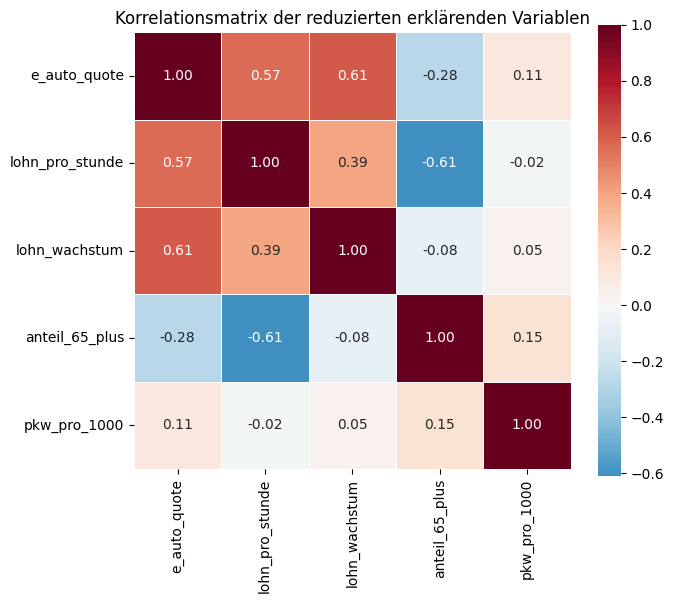

In [97]:
# ============================================================
# REDUKTIONSENTSCHEIDUNG (METHODISCHER KOMMENTAR)
# ============================================================
#
# Ziel:
# Auf Basis der explorativen Korrelationsanalyse werden erklärende
# Variablen auf ein reduziertes, empirisch begründetes Set verdichtet,
# das für Visualisierung und weiterführende Analysen geeignet ist.
#
# Reduktionsprinzipien:
# 1) Pro latenter Dimension wird maximal eine Variable ausgewählt.
# 2) Auswahlkriterium ist die Stärke und Stabilität des bivariaten
#    Zusammenhangs mit der E-Auto-Quote.
# 3) Stark korrelierte, inhaltlich redundante Variablen werden nicht
#    parallel verwendet (Multikollinearität).
# 4) Schwache oder nicht signifikante Dimensionen werden ausgeschlossen.
#
# Ergebnis der Reduktion:
#
# (A) Einkommensniveau
#     -> lohn_pro_stunde
#        Begründung:
#        - sehr starke Korrelation (r ≈ 0.57)
#        - klar interpretierbar als Produktivitäts- und Einkommensmaß
#        - entgelt_pro_stunde inhaltlich redundant
#
# (B) Ökonomische Dynamik
#     -> lohn_wachstum
#        Begründung:
#        - stärkster beobachteter Zusammenhang (r ≈ 0.61)
#        - misst strukturelle Dynamik statt reines Niveau
#
# (C) Demografie
#     -> anteil_65_plus
#        Begründung:
#        - moderat starker negativer Zusammenhang (r ≈ -0.28)
#        - stabiler Altersstrukturindikator
#        - anteil_18_35 spiegelbildlich und daher redundant
#
# (D) Mobilitätsniveau (Kontrolle)
#     -> pkw_pro_1000
#        Begründung:
#        - schwacher, aber signifikanter Zusammenhang
#        - geeignet als Kontrollvariable
#
# Ausgeschlossen:
# - Arbeitsintensität (kein signifikanter Zusammenhang)
# - Entgeltstruktur (keine belastbaren Effekte, geringe n)
# - Beschäftigungsstruktur (sehr geringe Effektstärken)
#
# Das reduzierte Variablenset bildet die empirisch relevanten
# Dimensionen ab und ist für Visualisierung und weiterführende
# Analyse geeignet.
# ============================================================


# ============================================================
# VISUALISIERUNG: KORRELATIONEN DER REDUZIERTEN VARIABLEN
# ============================================================

import seaborn as sns
import matplotlib.pyplot as plt

vars_reduced = [
    "e_auto_quote",
    "lohn_pro_stunde",
    "lohn_wachstum",
    "anteil_65_plus",
    "pkw_pro_1000"
]

corr_mat = panel[vars_reduced].corr()

plt.figure(figsize=(7, 6))
sns.heatmap(
    corr_mat,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    square=True,
    linewidths=0.5
)

plt.title("Korrelationsmatrix der reduzierten erklärenden Variablen")
plt.tight_layout()
plt.show()


In [51]:
# ============================================================
# SCHRITT 1 (KORRIGIERT): PARTIELLE KORRELATIONEN
# ============================================================
#
# Methodische Korrektur:
# Alle beteiligten Variablen werden vorab auf einen gemeinsamen
# Datensatz mit vollständigen Beobachtungen beschränkt.
# Nur so ist eine partielle Korrelation statistisch gültig.
#
# Ziel:
# Prüfung, ob der Zusammenhang zwischen
# - Einkommensniveau (lohn_pro_stunde)
# - ökonomischer Dynamik (lohn_wachstum)
# und der E-Auto-Quote
# unabhängig von der Altersstruktur (anteil_65_plus) besteht.
# ============================================================

from scipy.stats import pearsonr
import statsmodels.api as sm

# -----------------------------
# Gemeinsamer Analyse-Datensatz
# -----------------------------
vars_needed = [
    "e_auto_quote",
    "lohn_pro_stunde",
    "lohn_wachstum",
    "anteil_65_plus"
]

pc_data = panel[vars_needed].dropna().copy()

print(f"Beobachtungen für partielle Korrelation: n = {len(pc_data)}")

# -----------------------------
# Partielle Korrelation (sauber)
# -----------------------------
def partial_corr_clean(x, y, controls, data):
    X = sm.add_constant(data[controls])
    rx = sm.OLS(data[x], X).fit().resid
    ry = sm.OLS(data[y], X).fit().resid
    return pearsonr(rx, ry)

tests = ["lohn_pro_stunde", "lohn_wachstum"]

for v in tests:
    r, p = partial_corr_clean(v, "e_auto_quote", ["anteil_65_plus"], pc_data)
    print(f"{v:20s} | partial r = {r:.3f} | p = {p:.3e}")


Beobachtungen für partielle Korrelation: n = 1332
lohn_pro_stunde      | partial r = 0.551 | p = 1.773e-106
lohn_wachstum        | partial r = 0.620 | p = 1.790e-142


In [98]:
# ============================================================
# SCHRITT 2: MULTIVARIATE BASISREGRESSION
# ============================================================
#
# Ziel:
# Gemeinsame Betrachtung der zentralen erklärenden Dimensionen:
# - Einkommensniveau
# - ökonomische Dynamik
# - demografische Struktur
#
# Modell:
# e_auto_quote ~ lohn_pro_stunde + lohn_wachstum + anteil_65_plus
#
# Zweck:
# - Richtung und relative Stärke der Effekte
# - keine kausale Interpretation, rein erklärend
# ============================================================

import statsmodels.formula.api as smf

reg_data = panel[
    ["e_auto_quote", "lohn_pro_stunde", "lohn_wachstum", "anteil_65_plus"]
].dropna()

model = smf.ols(
    "e_auto_quote ~ lohn_pro_stunde + lohn_wachstum + anteil_65_plus",
    data=reg_data
).fit()

print(model.summary())


                            OLS Regression Results                            
Dep. Variable:           e_auto_quote   R-squared:                       0.538
Model:                            OLS   Adj. R-squared:                  0.537
Method:                 Least Squares   F-statistic:                     515.4
Date:                Sun, 18 Jan 2026   Prob (F-statistic):          4.73e-222
Time:                        18:33:28   Log-Likelihood:                 5066.1
No. Observations:                1332   AIC:                        -1.012e+04
Df Residuals:                    1328   BIC:                        -1.010e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -0.0186      0.003     

## Multivariate Regressionsanalyse

Zur gemeinsamen Bewertung der zentralen erklärenden Dimensionen wurde eine lineare OLS-Regression geschätzt. Die abhängige Variable ist die **E-Auto-Quote** auf Kreisebene. Als erklärende Variablen wurden aufgenommen:

- **Lohn pro Arbeitsstunde** (Einkommensniveau / Produktivität),
- **Lohnwachstum** (ökonomische Dynamik),
- **Anteil der Bevölkerung ab 65 Jahren** (demografische Struktur).

Die Analyse basiert auf einem gemeinsamen Datensatz mit vollständigen Beobachtungen für alle Variablen (n = 1332).

### Modellgüte

Das Modell weist eine hohe erklärte Varianz auf:

- R² = 0.538  
- Adjustiertes R² = 0.537  

Damit erklärt das Modell mehr als die Hälfte der beobachteten Unterschiede in der E-Auto-Quote zwischen den Kreisen. Der globale F-Test ist hochsignifikant (p < 0.001), was auf eine insgesamt sehr gute Modellpassung hinweist.

### Koeffizienten und Interpretation

- **Lohn pro Arbeitsstunde**  
  Der Koeffizient ist positiv und hochsignifikant (p < 0.001). Kreise mit höherem Lohnniveau pro Arbeitsstunde weisen – bei Kontrolle der übrigen Variablen – eine deutlich höhere E-Auto-Quote auf. Dies spricht für einen stabilen Zusammenhang zwischen regionaler ökonomischer Leistungsfähigkeit und der Verbreitung von Elektrofahrzeugen.

- **Lohnwachstum**  
  Auch das Lohnwachstum zeigt einen positiven und hochsignifikanten Effekt (p < 0.001). Der Effekt ist stärker als der des Einkommensniveaus und bestätigt, dass **ökonomische Dynamik** – nicht nur statischer Wohlstand – eng mit der regionalen Durchdringung von Elektrofahrzeugen zusammenhängt.

- **Anteil der Bevölkerung ab 65 Jahren**  
  Der Koeffizient ist negativ, jedoch statistisch nicht signifikant (p = 0.111), sobald Einkommensniveau und Dynamik berücksichtigt werden. Dies deutet darauf hin, dass der zuvor beobachtete bivariate Zusammenhang zwischen Altersstruktur und E-Auto-Quote weitgehend durch ökonomische Faktoren vermittelt wird.

### Einordnung

Die Regressionsergebnisse bestätigen die vorhergehenden Korrelations- und partiellen Korrelationsanalysen. Sowohl **Einkommensniveau** als auch **ökonomische Dynamik** weisen eigenständige, robuste Zusammenhänge mit der E-Auto-Quote auf. Die demografische Struktur verliert dagegen im multivariaten Kontext an Erklärungskraft.

Insgesamt deuten die Ergebnisse darauf hin, dass die regionale Verbreitung von Elektrofahrzeugen vor allem mit **ökonomischer Leistungsfähigkeit und wirtschaftlicher Dynamik** verknüpft ist, während demografische Effekte nach Kontrolle dieser Faktoren eine untergeordnete Rolle spielen.


In [99]:
# ============================================================
# ROBUSTHEITSPRÜFUNG: STANDARDISIERTE REGRESSION
# ============================================================
#
# Ziel:
# Vergleich der relativen Effektstärken der erklärenden Variablen.
# Durch Z-Standardisierung werden alle Prädiktoren
# auf Mittelwert 0 und Standardabweichung 1 skaliert.
#
# Interpretation:
# - Koeffizienten sind direkt vergleichbar
# - Richtung und Signifikanz bleiben unverändert
# ============================================================

from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

std_vars = [
    "e_auto_quote",
    "lohn_pro_stunde",
    "lohn_wachstum",
    "anteil_65_plus"
]

std_data = panel[std_vars].dropna().copy()

scaler = StandardScaler()
std_data[std_vars] = scaler.fit_transform(std_data[std_vars])

X = std_data[["lohn_pro_stunde", "lohn_wachstum", "anteil_65_plus"]]
X = sm.add_constant(X)
y = std_data["e_auto_quote"]

std_model = sm.OLS(y, X).fit()
print(std_model.summary())


                            OLS Regression Results                            
Dep. Variable:           e_auto_quote   R-squared:                       0.538
Model:                            OLS   Adj. R-squared:                  0.537
Method:                 Least Squares   F-statistic:                     515.4
Date:                Sun, 18 Jan 2026   Prob (F-statistic):          4.73e-222
Time:                        18:33:33   Log-Likelihood:                -1375.8
No. Observations:                1332   AIC:                             2760.
Df Residuals:                    1328   BIC:                             2780.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -1.67e-16      0.019  -8.

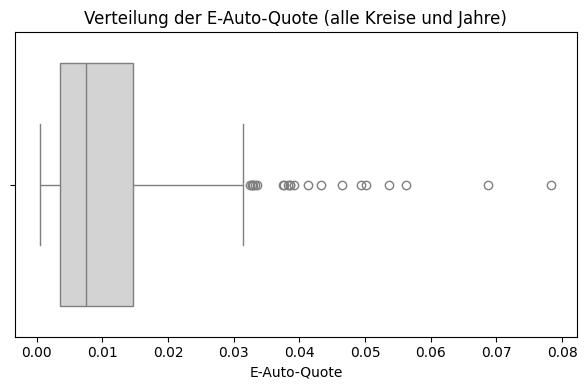

In [100]:
# ============================================================
# GRAFIK 1: VERTEILUNG DER E-AUTO-QUOTE (BOXPLOT)
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.boxplot(
    x=panel["e_auto_quote"],
    color="lightgray"
)

plt.xlabel("E-Auto-Quote")
plt.title("Verteilung der E-Auto-Quote (alle Kreise und Jahre)")
plt.tight_layout()
plt.show()


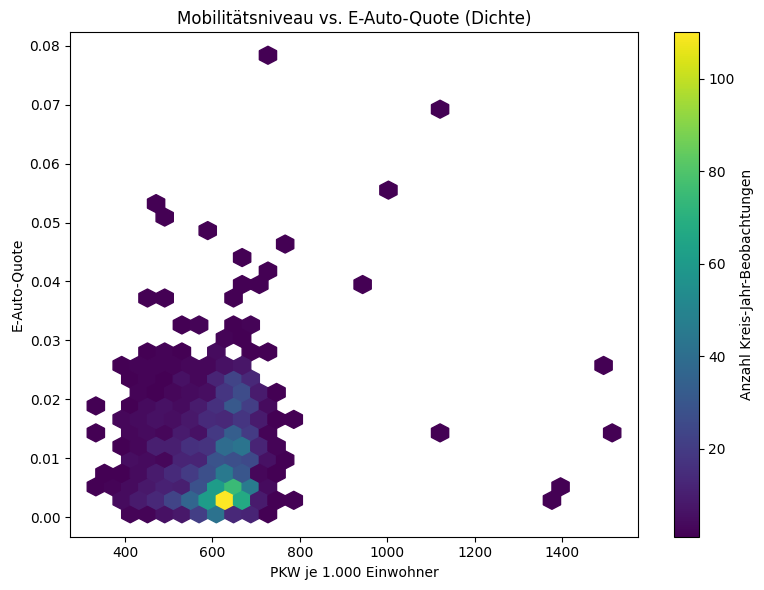

In [101]:
# ============================================================
# GRAFIK 2: MOBILITÄTSNIVEAU VS. E-AUTO-QUOTE (HEXBIN)
# ============================================================

import numpy as np

d = panel[["pkw_pro_1000", "e_auto_quote"]].dropna()

plt.figure(figsize=(8, 6))
plt.hexbin(
    d["pkw_pro_1000"],
    d["e_auto_quote"],
    gridsize=30,
    mincnt=1
)

plt.xlabel("PKW je 1.000 Einwohner")
plt.ylabel("E-Auto-Quote")
plt.title("Mobilitätsniveau vs. E-Auto-Quote (Dichte)")
plt.colorbar(label="Anzahl Kreis-Jahr-Beobachtungen")
plt.tight_layout()
plt.show()



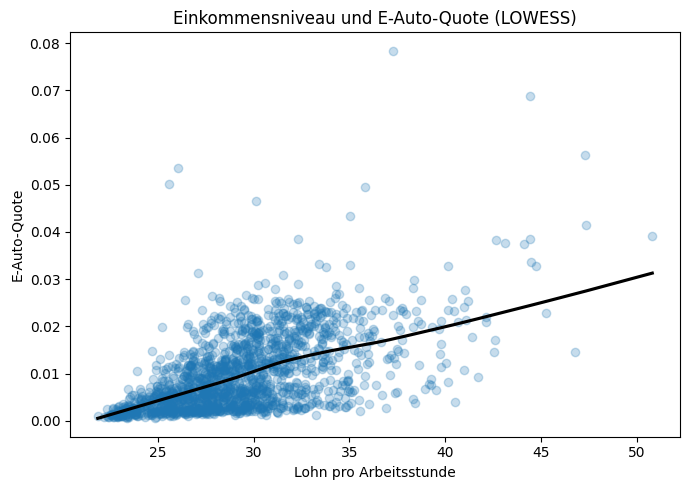

In [102]:
# ============================================================
# GRAFIK 3: LOHN PRO STUNDE VS. E-AUTO-QUOTE (LOWESS)
# ============================================================

plt.figure(figsize=(7, 5))
sns.regplot(
    data=panel,
    x="lohn_pro_stunde",
    y="e_auto_quote",
    lowess=True,
    scatter_kws={"alpha": 0.25},
    line_kws={"color": "black"}
)

plt.xlabel("Lohn pro Arbeitsstunde")
plt.ylabel("E-Auto-Quote")
plt.title("Einkommensniveau und E-Auto-Quote (LOWESS)")
plt.tight_layout()
plt.show()



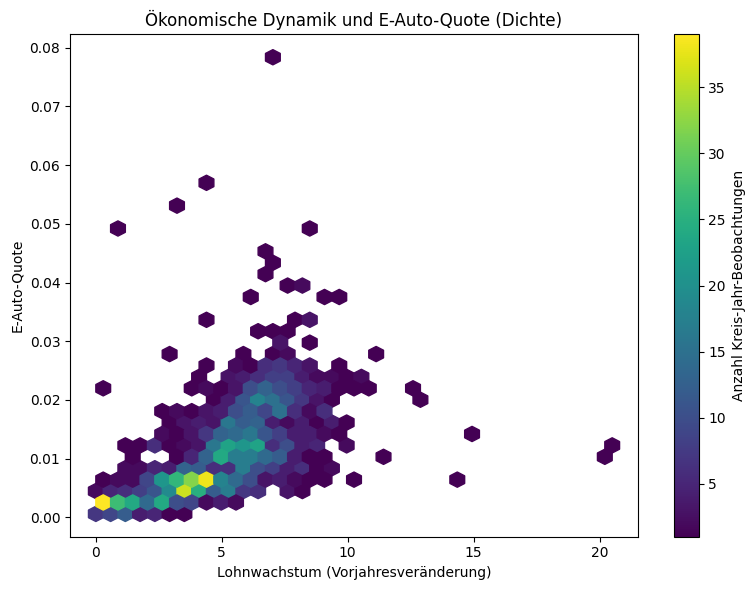

In [103]:
# ============================================================
# NEUE GRAFIK 4: LOHNWACHSTUM VS. E-AUTO-QUOTE (HEXBIN)
# ============================================================

d = panel[["lohn_wachstum", "e_auto_quote"]].dropna()

plt.figure(figsize=(8, 6))
hb = plt.hexbin(
    d["lohn_wachstum"],
    d["e_auto_quote"],
    gridsize=35,
    mincnt=1,
    cmap="viridis"
)

plt.colorbar(hb, label="Anzahl Kreis-Jahr-Beobachtungen")
plt.xlabel("Lohnwachstum (Vorjahresveränderung)")
plt.ylabel("E-Auto-Quote")
plt.title("Ökonomische Dynamik und E-Auto-Quote (Dichte)")

plt.tight_layout()
plt.show()



/var/folders/_m/7vnw5qh16j1br3v68tndq9xr0000gn/T/ipykernel_70181/3948966482.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = d.groupby("age_bin").agg(


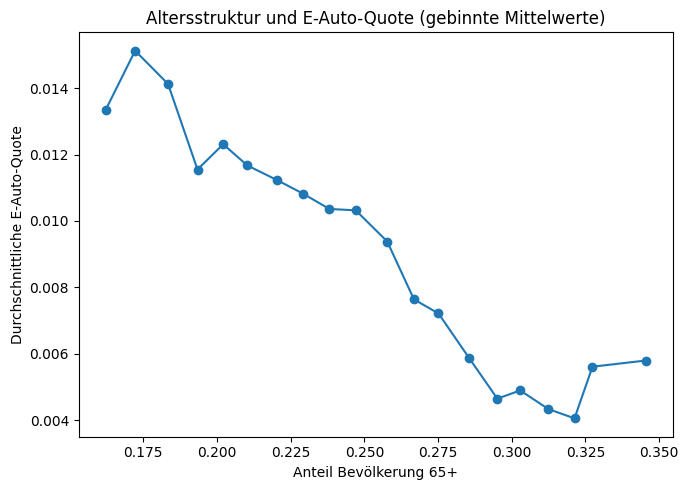

In [104]:
# ============================================================
# NEUE GRAFIK 5: ALTERSTRUKTUR VS. E-AUTO-QUOTE (BINNED MEANS)
# ============================================================

d = panel[["anteil_65_plus", "e_auto_quote"]].dropna().copy()

# 20 gleich große Bins
d["age_bin"] = pd.cut(d["anteil_65_plus"], bins=20)

grouped = d.groupby("age_bin").agg(
    age_mid=("anteil_65_plus", "mean"),
    ev_mean=("e_auto_quote", "mean"),
    n=("e_auto_quote", "size")
).reset_index(drop=True)

plt.figure(figsize=(7, 5))
plt.plot(grouped["age_mid"], grouped["ev_mean"], marker="o")

plt.xlabel("Anteil Bevölkerung 65+")
plt.ylabel("Durchschnittliche E-Auto-Quote")
plt.title("Altersstruktur und E-Auto-Quote (gebinnte Mittelwerte)")

plt.tight_layout()
plt.show()



ZEITANALYSE: DATENABDECKUNG
Beobachtungen pro Jahr (alle vorhandenen Werte, ohne DropNA):


,jahr,n
0,2020,476
1,2021,476
2,2022,476
3,2023,476



Beobachtungen pro Jahr (vollständig für Modelle):


,jahr,n_complete
0,2020,151
1,2021,389
2,2022,397
3,2023,395



Zeitstatistik E-Auto-Quote:


,jahr,count,mean,median,std
0,2020,400,0.002688,0.002383,0.002745
1,2021,400,0.006034,0.005639,0.004581
2,2022,399,0.011952,0.011690,0.004782
3,2023,399,0.019508,0.019534,0.006809


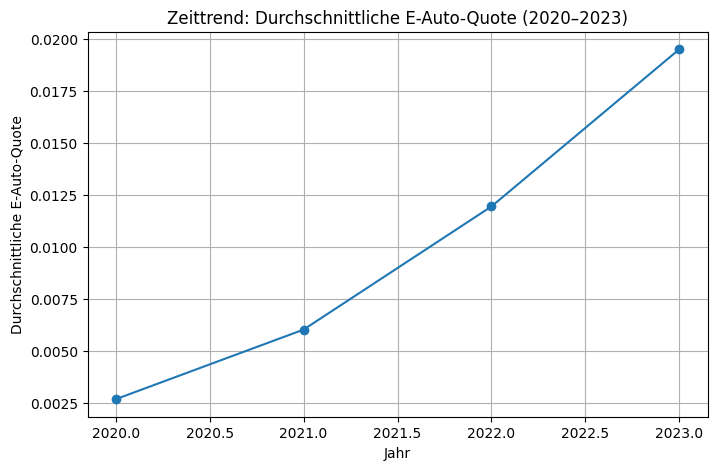

<Figure size 900x500 with 0 Axes>

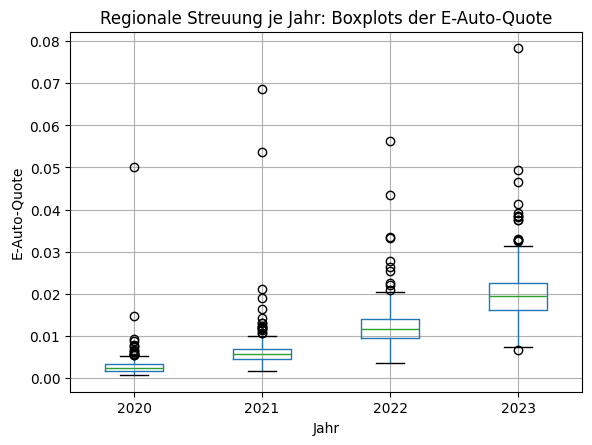

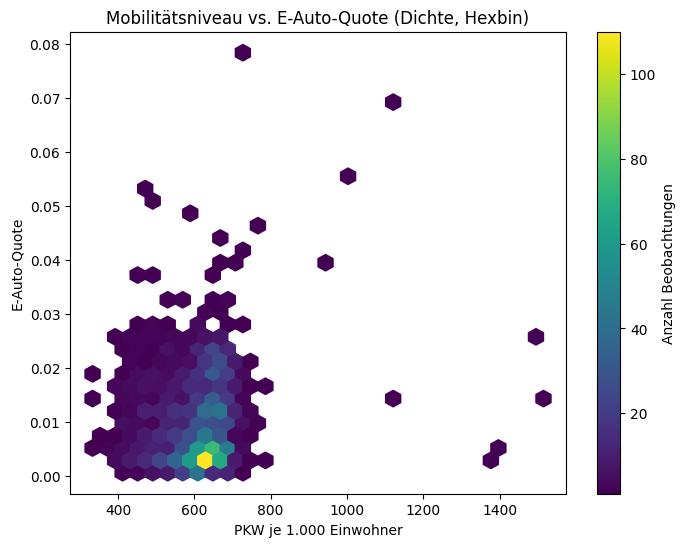


WITHIN-YEAR KORRELATIONEN: e_auto_quote vs. lohn_pro_stunde


,jahr,r_eauto_lohn_pro_stunde,p,n
0,2020,0.142873,8.010850e-02,151
1,2021,0.405694,7.618973e-17,389
2,2022,0.628769,4.469234e-45,397
3,2023,0.551626,7.894470e-33,395


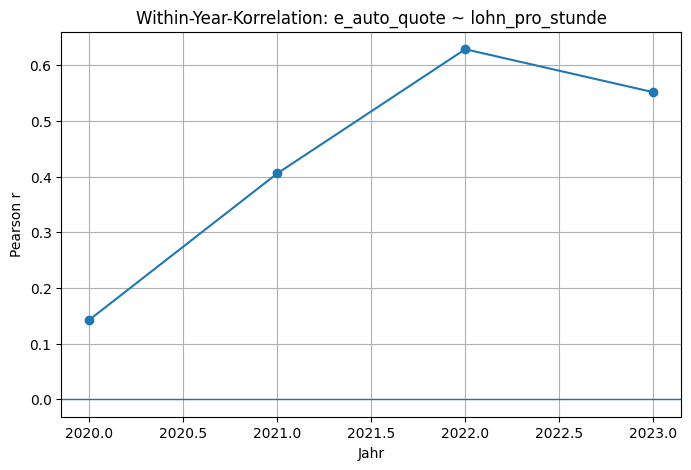


REGRESSION: Zeitkontrolle über Jahres-Dummies (C(jahr))
                            OLS Regression Results                            
Dep. Variable:           e_auto_quote   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.712
Method:                 Least Squares   F-statistic:                     549.6
Date:                Sun, 18 Jan 2026   Prob (F-statistic):               0.00
Time:                        18:42:34   Log-Likelihood:                 5384.1
No. Observations:                1332   AIC:                        -1.075e+04
Df Residuals:                    1325   BIC:                        -1.072e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

,jahr,year_effect
0,2020,0.000000
1,2021,0.002177
2,2022,0.007457
3,2023,0.014028


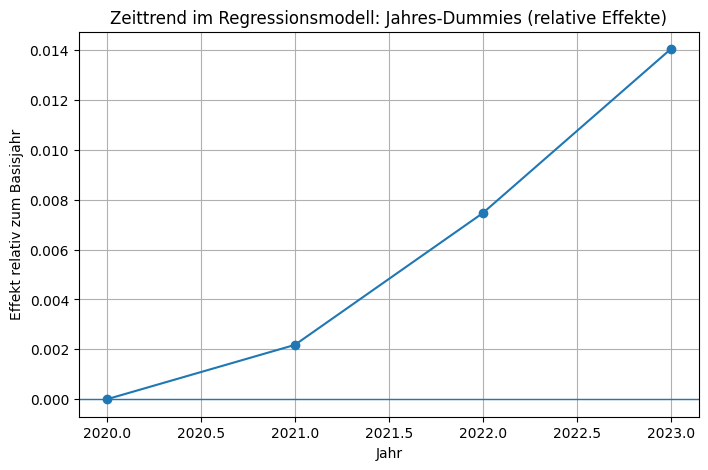

In [105]:
# ============================================================
# ZEITANALYSE (2020–2023): DESKRIPTIV + VISUALISIERUNG + MODELLE
# ============================================================
#
# Ziel dieses Blocks:
# 1) Explizit zeigen, dass die E-Auto-Quote über die Jahre steigt (Zeittrend).
# 2) Gleichzeitig zeigen, dass es innerhalb jedes Jahres starke regionale Unterschiede gibt (Struktur).
# 3) Analytisch prüfen, ob der Zusammenhang von Einkommen/Dynamik mit der E-Auto-Quote
#    auch dann bestehen bleibt, wenn wir das Jahr als Zeitkontrolle (Jahres-Dummies) aufnehmen.
# 4) Zusätzlich: "Within-Year"-Korrelationen (getrennt pro Jahr), um zu zeigen, dass die Effekte
#    nicht nur durch den allgemeinen Zeittrend entstehen.
#
# Voraussetzung:
# - panel ist bereits erstellt und enthält mindestens:
#   ["kreis_id", "jahr", "e_auto_quote", "lohn_pro_stunde", "lohn_wachstum", "anteil_65_plus"]
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import statsmodels.formula.api as smf
from IPython.display import display

# ------------------------------------------------------------
# 0) Minimale Datensatzprüfung + gemeinsame Analysebasis
# ------------------------------------------------------------
needed = ["jahr", "kreis_id", "e_auto_quote", "lohn_pro_stunde", "lohn_wachstum", "anteil_65_plus"]
missing_cols = [c for c in needed if c not in panel.columns]
if missing_cols:
    raise ValueError(f"Panel fehlt Spalten: {missing_cols}")

# Wir bauen einen "analytischen Kern-Datensatz", der die Variablen enthält,
# die wir für die Zeitmodelle brauchen.
# Wichtig: Dropna wird hier erst einmal NICHT global gemacht, weil:
# - Für Deskriptivplots reicht oft mehr Datenmaterial
# - Für Regressionsmodelle und Korrelationen brauchen wir aber vollständige Fälle
d_all = panel[needed].copy()

# Typisierung: Jahr als int (damit C(jahr) stabil funktioniert)
d_all["jahr"] = pd.to_numeric(d_all["jahr"], errors="coerce").astype("Int64")

# ------------------------------------------------------------
# 1) Schnelle Übersicht: Beobachtungen pro Jahr (für Transparenz)
# ------------------------------------------------------------
print("ZEITANALYSE: DATENABDECKUNG")
print("=" * 70)
print("Beobachtungen pro Jahr (alle vorhandenen Werte, ohne DropNA):")
display(d_all.groupby("jahr").size().rename("n").reset_index())

# Für die Kernanalysen (Regression / Korrelation) brauchen wir vollständige Fälle:
d = d_all.dropna().copy()

print("\nBeobachtungen pro Jahr (vollständig für Modelle):")
display(d.groupby("jahr").size().rename("n_complete").reset_index())

# ------------------------------------------------------------
# 2) DESKRIPTIV: Zeittrend der E-Auto-Quote (Mittelwert je Jahr)
# ------------------------------------------------------------
# Idee: Wenn der Mittelwert jedes Jahr steigt, ist ein allgemeiner Zeittrend plausibel.
year_stats = (
    d_all.dropna(subset=["e_auto_quote"])
        .groupby("jahr")["e_auto_quote"]
        .agg(["count", "mean", "median", "std"])
        .reset_index()
)

print("\nZeitstatistik E-Auto-Quote:")
display(year_stats)

plt.figure(figsize=(8, 5))
plt.plot(year_stats["jahr"], year_stats["mean"], marker="o")
plt.xlabel("Jahr")
plt.ylabel("Durchschnittliche E-Auto-Quote")
plt.title("Zeittrend: Durchschnittliche E-Auto-Quote (2020–2023)")
plt.grid(True)
plt.show()

# ------------------------------------------------------------
# 3) DESKRIPTIV: Verteilung (Boxplot) pro Jahr
# ------------------------------------------------------------
# Idee: Boxplots zeigen, ob die Streuung zwischen Kreisen groß bleibt,
# also ob "Regionalstruktur" auch innerhalb eines Jahres relevant ist.
plt.figure(figsize=(9, 5))
d_all.dropna(subset=["e_auto_quote"]).boxplot(column="e_auto_quote", by="jahr")
plt.suptitle("")  # entfernt die automatische Pandas-Überschrift
plt.xlabel("Jahr")
plt.ylabel("E-Auto-Quote")
plt.title("Regionale Streuung je Jahr: Boxplots der E-Auto-Quote")
plt.show()

# ------------------------------------------------------------
# 4) DICHTEPLOT (Hexbin): Mobilitätsniveau vs. E-Auto-Quote
# ------------------------------------------------------------
# Du hattest explizit diese Art Visualisierung genannt.
# Idee: Hexbin zeigt dichte Bereiche bei vielen Kreisen (statt Overplotting).
# Hinweis: Falls "pkw_pro_1000" nicht im Panel ist, skippen wir den Plot.
if "pkw_pro_1000" in panel.columns:
    d_hex = panel[["pkw_pro_1000", "e_auto_quote"]].dropna().copy()

    plt.figure(figsize=(8, 6))
    plt.hexbin(d_hex["pkw_pro_1000"], d_hex["e_auto_quote"], gridsize=30, mincnt=1)
    plt.xlabel("PKW je 1.000 Einwohner")
    plt.ylabel("E-Auto-Quote")
    plt.title("Mobilitätsniveau vs. E-Auto-Quote (Dichte, Hexbin)")
    plt.colorbar(label="Anzahl Beobachtungen")
    plt.show()
else:
    print("\nHinweis: 'pkw_pro_1000' nicht im Panel -> Hexbin-Plot übersprungen.")

# ------------------------------------------------------------
# 5) WITHIN-YEAR KORRELATIONEN (pro Jahr separat)
# ------------------------------------------------------------
# Idee: Wenn der Zusammenhang Einkommen~E-Auto-Quote innerhalb jedes Jahres existiert,
# dann ist er nicht nur ein Artefakt des generellen Zeittrends.
rows = []
for y in sorted(d["jahr"].unique()):
    dy = d.loc[d["jahr"] == y, ["e_auto_quote", "lohn_pro_stunde"]].dropna()
    if len(dy) >= 3:
        r, p = pearsonr(dy["e_auto_quote"], dy["lohn_pro_stunde"])
        rows.append({"jahr": int(y), "r_eauto_lohn_pro_stunde": r, "p": p, "n": len(dy)})

within_year_corr = pd.DataFrame(rows).sort_values("jahr")
print("\nWITHIN-YEAR KORRELATIONEN: e_auto_quote vs. lohn_pro_stunde")
display(within_year_corr)

plt.figure(figsize=(8, 5))
plt.plot(within_year_corr["jahr"], within_year_corr["r_eauto_lohn_pro_stunde"], marker="o")
plt.axhline(0, linewidth=1)
plt.xlabel("Jahr")
plt.ylabel("Pearson r")
plt.title("Within-Year-Korrelation: e_auto_quote ~ lohn_pro_stunde")
plt.grid(True)
plt.show()

# ------------------------------------------------------------
# 6) REGRESSION MIT JAHRES-DUMMIES (Zeitkontrolle)
# ------------------------------------------------------------
# Modellidee:
# e_auto_quote_it = b1*lohn_pro_stunde_it + b2*lohn_wachstum_it + b3*anteil_65_plus_i + YearFE + error
#
# Interpretation:
# - b1 zeigt den Zusammenhang "innerhalb der Jahre" (Zeittrend herausgerechnet).
# - b2 zeigt, ob wirtschaftliche Dynamik zusätzlich erklärt.
# - die YearFE zeigen den allgemeinen Zeiteffekt.
#
# Wichtig:
# C(jahr) erzeugt Dummy-Variablen; eine Kategorie ist Referenz (typisch: erstes Jahr).
d_reg = d.copy()
d_reg["jahr"] = d_reg["jahr"].astype(int)

model_time = smf.ols(
    formula="e_auto_quote ~ lohn_pro_stunde + lohn_wachstum + anteil_65_plus + C(jahr)",
    data=d_reg
).fit()

print("\nREGRESSION: Zeitkontrolle über Jahres-Dummies (C(jahr))")
print(model_time.summary())

# ------------------------------------------------------------
# 7) OPTIONAL: Visualisierung der Jahres-Dummies (Zeittrend im Modell)
# ------------------------------------------------------------
# Wir extrahieren die geschätzten Jahrseffekte aus dem Modell.
# Referenzjahr ist das Jahr, das statsmodels als baseline nimmt (meist das kleinste Jahr).
params = model_time.params
year_terms = {k: v for k, v in params.items() if k.startswith("C(jahr)")}

# Referenzjahr: kleinster Wert in d_reg["jahr"]
base_year = int(d_reg["jahr"].min())

# Wir konstruieren eine Tabelle: Effekt relativ zum Basisjahr.
year_effects = [{"jahr": base_year, "year_effect": 0.0}]
for term, val in year_terms.items():
    # term sieht z.B. so aus: "C(jahr)[T.2021]"
    y_str = term.split("T.")[-1].replace("]", "")
    year_effects.append({"jahr": int(y_str), "year_effect": float(val)})

year_effects = pd.DataFrame(year_effects).sort_values("jahr")

print("\nGeschätzte Jahrseffekte (relativ zum Basisjahr):")
display(year_effects)

plt.figure(figsize=(8, 5))
plt.plot(year_effects["jahr"], year_effects["year_effect"], marker="o")
plt.axhline(0, linewidth=1)
plt.xlabel("Jahr")
plt.ylabel("Effekt relativ zum Basisjahr")
plt.title("Zeittrend im Regressionsmodell: Jahres-Dummies (relative Effekte)")
plt.grid(True)
plt.show()


## Diskussion der Regressions- und Korrelationsbefunde

Die Regressionsanalyse mit expliziter Zeitkontrolle über Jahres-Dummies (C(jahr)) liefert ein konsistentes und differenziertes Bild der Determinanten regionaler Unterschiede in der E-Auto-Quote. Mit einem erklärten Varianzanteil von R² = 0.713 zeigt das Modell insgesamt eine hohe Erklärungskraft, was darauf hindeutet, dass sowohl zeitliche als auch strukturelle Faktoren einen wesentlichen Beitrag zur Erklärung der beobachteten Unterschiede leisten.

### Zeitliche Effekte (Jahres-Dummies)

Die Koeffizienten der Jahres-Dummies sind durchweg positiv, hochsignifikant und nehmen monoton zu. Im Vergleich zum Referenzjahr 2020 liegt die durchschnittliche E-Auto-Quote im Jahr 2021 um etwa 0.22 Prozentpunkte höher, im Jahr 2022 um rund 0.75 Prozentpunkte und im Jahr 2023 um etwa 1.4 Prozentpunkte. Diese Ergebnisse spiegeln einen starken, landesweiten Diffusionsprozess wider, der unabhängig von regionalen Eigenschaften wirkt. Der zeitliche Trend bestätigt, dass Elektromobilität in diesem Zeitraum stark an Marktdurchdringung gewonnen hat, was mit politischen Fördermaßnahmen, technologischem Fortschritt und wachsender gesellschaftlicher Akzeptanz vereinbar ist.

### Einkommensniveau (lohn_pro_stunde)

Der Bruttostundenlohn weist auch unter Kontrolle der Zeitdimension einen signifikanten und positiven Effekt auf die E-Auto-Quote auf (β ≈ 0.0005, p < 0.001). Inhaltlich bedeutet dies, dass Regionen mit höherem Einkommensniveau systematisch höhere Anteile an Elektrofahrzeugen aufweisen, selbst wenn der allgemeine Zeittrend berücksichtigt wird. Der Effekt ist damit nicht lediglich ein Artefakt der zeitlichen Diffusion, sondern verweist auf stabile strukturelle Unterschiede in der Zahlungsfähigkeit und Investitionsbereitschaft der Haushalte.

Die Stärke dieses Effekts relativiert sich gegenüber Modellen ohne Zeitkontrolle, bleibt jedoch klar statistisch und inhaltlich bedeutsam. Dies spricht dafür, dass Einkommensunterschiede insbesondere bei fortschreitender Marktreife weiterhin eine relevante Rolle spielen.

### Ökonomische Dynamik (lohn_wachstum)

Das Lohnwachstum gegenüber dem Vorjahr zeigt im zeitkontrollierten Modell keinen signifikanten Zusammenhang mit der E-Auto-Quote (p = 0.330). Während bivariate Analysen zuvor noch einen starken Zusammenhang nahelegten, verschwindet dieser Effekt vollständig, sobald zeitliche Effekte explizit modelliert werden. Dies deutet darauf hin, dass kurzfristige Wachstumsimpulse primär den allgemeinen Diffusionstrend widerspiegeln, jedoch keinen eigenständigen regionalen Erklärungsbeitrag leisten. Entscheidend ist somit weniger die aktuelle wirtschaftliche Dynamik einer Region als vielmehr ihr langfristiges Einkommensniveau.

### Demografische Struktur (anteil_65_plus)

Der Anteil der Bevölkerung im Alter von 65 Jahren und älter weist einen signifikant negativen Effekt auf die E-Auto-Quote auf (β ≈ −0.0425, p < 0.001). Regionen mit älterer Bevölkerungsstruktur haben – ceteris paribus – deutlich geringere E-Auto-Anteile. Dieser Befund bleibt auch unter Kontrolle von Einkommen und Zeit stabil und spricht für altersbezogene Unterschiede im Mobilitätsverhalten, in der Technologieakzeptanz oder in der infrastrukturellen Einbindung.

### Within-Year-Korrelationen

Die innerhalb der einzelnen Jahre berechneten Korrelationen zwischen E-Auto-Quote und Bruttostundenlohn zeigen eine deutliche zeitliche Struktur. Im Jahr 2020 ist der Zusammenhang schwach und statistisch nicht signifikant (r ≈ 0.14), während er ab 2021 stark ansteigt und in den Jahren 2022 und 2023 sehr hohe Werte erreicht (r ≈ 0.63 bzw. r ≈ 0.55, jeweils p < 0.001). Dies deutet darauf hin, dass Einkommensunterschiede mit zunehmender Marktreife eine immer größere Rolle für die regionale Verbreitung von Elektrofahrzeugen spielen. Während frühe Adoptionsphasen noch relativ homogen verlaufen, verstärken sich soziale und ökonomische Selektivitäten im Zeitverlauf.

### Methodische Einordnung

Die Kombination aus Zeit-Dummies und Within-Year-Analysen erlaubt eine klare Trennung zwischen allgemeinem Diffusionseffekt und stabilen regionalen Strukturunterschieden. Die Ergebnisse sprechen gegen eine rein zeitgetriebene Interpretation der E-Auto-Verbreitung und unterstreichen die Bedeutung sozioökonomischer und demografischer Faktoren für die regionale Ungleichverteilung der Elektromobilität.
